# <center> TP noté N°2 en Statistiques</center>

Nous travaillons sur la base de données diabetes de python. La base initiale comporte n “ 442
patients et p “ 10 covariables. La variable Y à expliquer est un score correspondant à l’évolution de la
maladie. Pour s’amuser, un robot malicieux a contaminé le jeu de données en y ajoutant 200 variables
explicatives inappropriées. Ensuite, non-content d’avoir déjà perverti notre jeu de données, il a volon-
tairement mélangé les variables entre elle de façon aléatoire. Bien entendu le robot a ensuite pris soin
d’effacer toute trace de son acte crapuleux si bien que nous ne connaissons pas les variables pertinentes.
La nouvelle base de données comporte n “ 442 patients et p “ 210 covariables, notés X. Saurez-vous
déjouer les plans de ce robot farceur et retrouver les variables pertinentes ?

In [1]:
# Importation des packages
import math
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn import linear_model
from sklearn.metrics import r2_score
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.preprocessing import StandardScaler
import scipy.stats as stat
from sklearn.model_selection import KFold
from sklearn import svm
from sklearn.preprocessing import PolynomialFeatures

# Question 1

Importer la base de données data_dm3.csv disponible depuis le lien https://bitbucket.org/portierf/shared_files/downloads/data_dm3.csv. La dernière colonne est la variable à 
expliquer. Les autres colonnes sont les variables explicatives. Préciser le nombre de variables explicatives
et le nombre d’observations.

### Création du Dataframe

In [2]:
#Partie pour le chargement des données
filename = "https://bitbucket.org/portierf/shared_files/downloads/data_dm3.csv"

#importation du fichier csv
df = pd.read_csv(filename, sep=',', header=None)
df.name = 'Diabètes'
#affichage uniquement des 5ères lignes
df.head(5)

,0,1,2,3,4,5,6,7,8,9,...,201,202,203,204,205,206,207,208,209,210
0,-1.298173,-0.162249,1.223379,1.355554,1.080171,0.634979,0.298741,0.548270,0.731773,1.018645,...,0.588278,0.210106,1.861458,-0.436399,0.279299,-1.416020,-2.332363,0.215096,-0.693319,151.0
1,0.166951,-0.338060,-0.618867,0.759366,1.134281,-0.536844,-0.075120,0.970251,-0.327487,0.717310,...,-0.251054,-0.825716,0.339139,1.119430,0.225958,-0.822288,0.382838,-0.718829,-0.188993,75.0
2,-0.416177,-0.205659,-1.282226,1.675500,1.523746,0.192029,-0.235840,-1.954626,-0.853309,0.892791,...,1.283837,0.372516,-0.652557,-2.579347,0.139267,-1.901196,0.048210,0.220205,0.471588,141.0
3,0.867184,-0.398667,0.093501,0.025971,1.852099,0.789774,0.801775,0.376711,0.853689,0.247953,...,0.446582,0.334733,0.399074,-0.884172,0.723819,1.316367,0.088218,0.619496,1.061662,206.0
4,1.193282,-0.936980,-0.725039,0.766078,0.223489,-1.584622,1.146866,0.086136,-0.088780,-0.945066,...,0.786157,-1.058179,-0.155788,-0.642504,2.040010,-1.703110,-1.901502,1.778811,-0.489853,135.0


### Informations sur le Dataframe

In [3]:
# récupération des informations sur le dataframe
infosDF = df.shape
print('Le dataframe possède',infosDF[0], 'lignes, ce qui correspond aux patients (observations)')
print('Le dataframe possède',infosDF[1], 'colonnes, dont', infosDF[1]-1, 'variables explicatives')

y_ = df.iloc[:,-1] #Dataframe avec uniquement la variable explicative
x_ = df.iloc[:,:-1] #Dataframe avec uniquement les variables expliquées



Le dataframe possède 442 lignes, ce qui correspond aux patients (observations)
Le dataframe possède 211 colonnes, dont 210 variables explicatives


# Question 2

Les variables explicatives sont-elles centrées ? Normalisées ? Qu’en est-il de la variable à expliquer ?
Tracer un scatter plot de la base de données avec 4 covariables prises au hasard et la variable à
expliquer (un scatterplot regroupe les graphes de chacune des variables en fonction de chacune des
autres). Commenter les graphiques obtenus.

#### Vue d'ensemble des variables explicatives

In [4]:
# Si la variable est centrée la moyenne = 0 et si réduite std = var = 1
print('Par souci de visibilité on fera la moyenne des moyennes et des std pour avoir une vision globale\n')

# visualisation des variables explicatives x_

print('La moyenne des moyennes des variables explicatives est :', round(x_.mean(axis=0).mean(),4)) #centrées 
print('La moyenne des écart-types des variables explicatives est :', round(x_.std(axis=0).mean(),4)) #normalisées 
print('De façon globale, les variables explicatives sont centrées et réduites')

Par souci de visibilité on fera la moyenne des moyennes et des std pour avoir une vision globale

La moyenne des moyennes des variables explicatives est : -0.0
La moyenne des écart-types des variables explicatives est : 1.0011
De façon globale, les variables explicatives sont centrées et réduites


#### prise en compte de 4 variables explicatives aléatoires

In [5]:
# Selection aléatoire de 4 variables explicatives
x_al = np.random.choice(range(0,infosDF[1]-1), 4, replace=False)

# Affichage des statistiques descriptives des variables explicatives
print(df[x_al].describe(include='all'))

print('\nSi la moyenne vaut +/- 0 et std +/- 1 alors les variables sont centrées et réduites')

                95            194           141           120
count  4.420000e+02  4.420000e+02  4.420000e+02  4.420000e+02
mean  -2.361108e-17 -6.530724e-18  1.331263e-17 -5.525997e-18
std    1.001133e+00  1.001133e+00  1.001133e+00  1.001133e+00
min   -2.545825e+00 -3.038337e+00 -2.738710e+00 -3.079906e+00
25%   -6.299159e-01 -6.866901e-01 -7.145304e-01 -7.436612e-01
50%    4.983883e-03 -4.107960e-03  3.399171e-02  2.515575e-02
75%    6.154733e-01  7.216427e-01  6.628612e-01  6.007149e-01
max    3.445274e+00  2.589192e+00  3.267243e+00  3.709093e+00

Si la moyenne vaut +/- 0 et std +/- 1 alors les variables sont centrées et réduites


#### la variable à expliquer

In [6]:
# Statistiques descriptives de y_
print(y_.describe(include='all'))

print('\nLa variable expliquée quant à elle n\'est ni réduite ni centrée')

count    442.000000
mean     152.133484
std       77.093005
min       25.000000
25%       87.000000
50%      140.500000
75%      211.500000
max      346.000000
Name: 210, dtype: float64

La variable expliquée quant à elle n'est ni réduite ni centrée


#### Plot

Les graphiques présentent la densité et les nuages de points entre 2 variables
Il n'y a pas d'informations pertinentes à noter, au sein des scatter plot.
Néanmoins on remarque que les variables explicatives sont bien normalisées, pas la variable expliquée


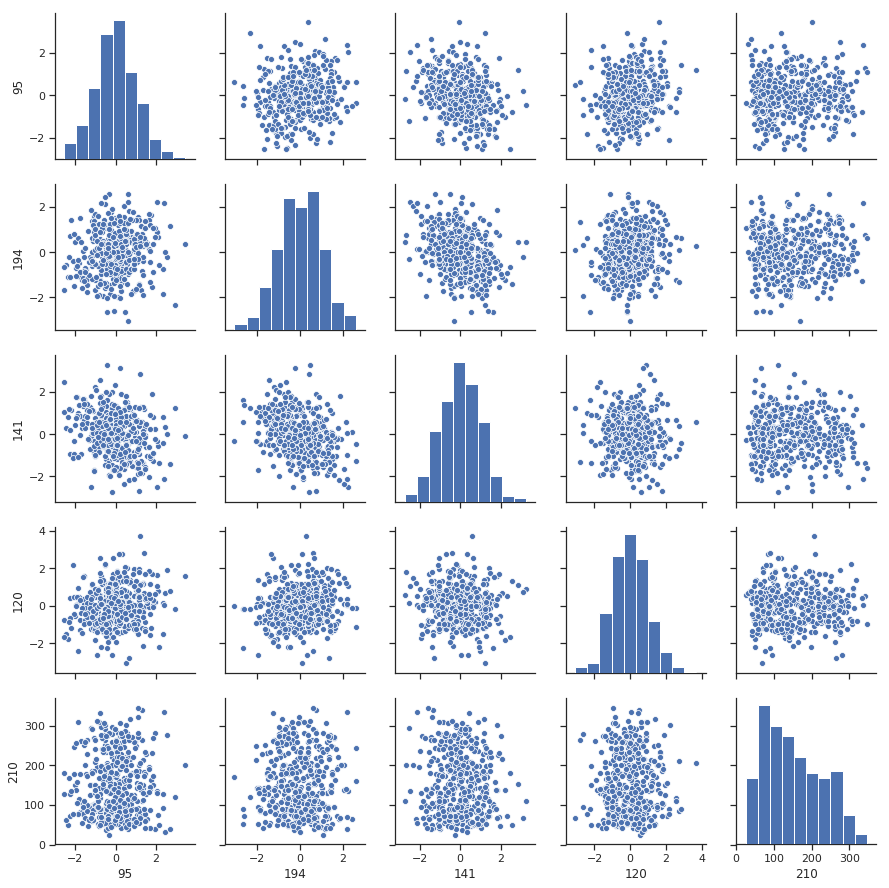

In [7]:
# on concatène x_al et y_
xAly_conc = pd.concat([df[x_al], y_], axis=1, sort=False)  

# plot du modele
sns.set(style="ticks", color_codes=True)
g = sns.pairplot(xAly_conc)
print('Les graphiques présentent la densité et les nuages de points entre 2 variables')
print('Il n\'y a pas d\'informations pertinentes à noter, au sein des scatter plot.')
print('Néanmoins on remarque que les variables explicatives sont bien normalisées, pas la variable expliquée')

# Question 3

Echantillon d’apprentissage et de test. Créer 2 échantillons : un pour apprendre le modèle X train ,
un pour tester le modèle X test . On mettra 20% de la base dans l’échantillon ’test’. Donner les tailles
de chacun des 2 échantillons. On notera que le nouvel échantillon de covariables X train n’est pas
normalizé. Dans la suite, on fera donc bien attention à inclure l’intercept dans nos régression.

### Création des échantillons

In [8]:
x_train, x_test, y_train, y_test = train_test_split(x_, y_, test_size=0.2, random_state=2)

print("La taille de l'échantillon des variables explicatives train est : \
{0} \nLa taille de l'échantillon test est {1}"
      .format(x_train.shape,x_test.shape))

print()

print("La taille de l'échantillon de la variables expliquée train est : \
{0} \nLa taille de l'échantillon test est {1}"
      .format(y_train.shape,y_test.shape))

La taille de l'échantillon des variables explicatives train est : (353, 210) 
La taille de l'échantillon test est (89, 210)

La taille de l'échantillon de la variables expliquée train est : (353,) 
La taille de l'échantillon test est (89,)


### Statistiques descriptive de variables de train

In [9]:
# Selection aléatoire de 6 variables explicatives du train
x_al_Q3 = np.random.choice(range(0,infosDF[1]-1), 12, replace=False)

# Affichage des statistiques descriptives des variables explicatives
print(x_train[x_al_Q3].describe(include='all'))

              195         110         141         162         29          70   \
count  353.000000  353.000000  353.000000  353.000000  353.000000  353.000000   
mean    -0.013161    0.010322   -0.017032    0.031244   -0.004196    0.023440   
std      1.013563    0.992512    1.015633    1.006440    1.000581    1.011376   
min     -3.406436   -2.707923   -2.738710   -2.664919   -3.163441   -3.218197   
25%     -0.766622   -0.686535   -0.734454   -0.715503   -0.662487   -0.595649   
50%     -0.049883    0.095456   -0.007812    0.023429    0.016882    0.097316   
75%      0.670888    0.697772    0.607281    0.729072    0.685071    0.790386   
max      2.611478    2.906467    3.267243    2.721596    2.467995    2.717514   

              62          200         157         58          208         135  
count  353.000000  353.000000  353.000000  353.000000  353.000000  353.000000  
mean     0.060002   -0.016018    0.025899   -0.043043    0.019510   -0.030197  
std      1.002569    1.013168 

# Question 4

Donner la matrice de covariance calculée sur X train . Tracer le graphe de la décroissance des valeurs
propres de la matrice de Variance-Covariance. Expliquer pourquoi il est légitime de ne garder que les premières
variables de l’ACP. On gardera 60 variables dans la suite.

### Matrice de Variances-Covariances

In [10]:
# Matrice de Var-Cov des x 
cov_x = x_train.cov()

# affichage de la matrice sous forme de HeatMap
cmap = cmap=sns.diverging_palette(5, 250, as_cmap=True)

def magnify():
    return [dict(selector="th",
                 props=[("font-size", "7pt")]),
            dict(selector="td",
                 props=[('padding', "0em 0em")]),
            dict(selector="th:hover",
                 props=[("font-size", "12pt")]),
            dict(selector="tr:hover td:hover",
                 props=[('max-width', '200px'),
                        ('font-size', '12pt')])
]

cov_x.style.background_gradient(cmap, axis=1)\
    .set_properties(**{'max-width': '80px', 'font-size': '10pt'})\
    .set_caption("HeatMap avec valeurs")\
    .set_precision(2)\
    .set_table_styles(magnify())


### Décroissance des valeurs propres

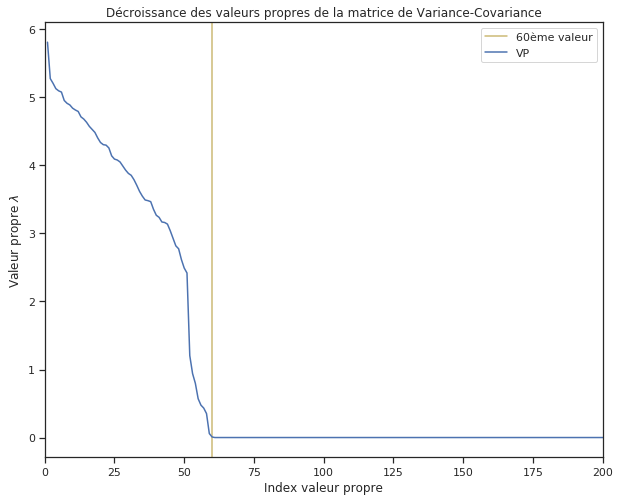

On remarque qu'après la 60ème valeur propre, ces dernières sont proches de 0.
Il semble donc intéressant de ne retenir que les 60 premières valeurs propres.


In [11]:
# Matrice de valeurs propres et vecteurs propres de de la matrice de Var-Cov
eigv_x, eigvect_x = np.linalg.eigh(cov_x)

# Graphique de décroissance des valeurs propres 
plt.figure(figsize=(10,8))
plt.gca().axes.set_xlim([0,200]) # on limite à 200 l'affichage des valeurs propres
plt.axvline(x=60, c='y', label='60ème valeur')
plt.plot(range(1,211), sorted(eigv_x, reverse=True), label='VP')
plt.title('Décroissance des valeurs propres de la matrice de Variance-Covariance')
plt.xlabel('Index valeur propre')
plt.ylabel('Valeur propre ' + r'$\lambda$')
plt.legend()
plt.show()

print('On remarque qu\'après la 60ème valeur propre, ces dernières sont proches de 0.\n\
Il semble donc intéressant de ne retenir que les 60 premières valeurs propres.')

# Question 5 

Suivant les observations de la question (Q4), appliquer la méthode de "PCA before OLS" qui
consiste à appliquer OLS avec Y et X train V p1:60q , où V p1:60q contient les vecteurs propres (associés
aux 60 plus grandes valeurs propres) de la matrice de covariance. Faire une régression linéaire (avec
intercept), puis tracer les valeurs des coefficients (hors intercept). Sur un autre graphique, faire de
même avec la méthode des moindres carrés classique.

### PCA Before OLS

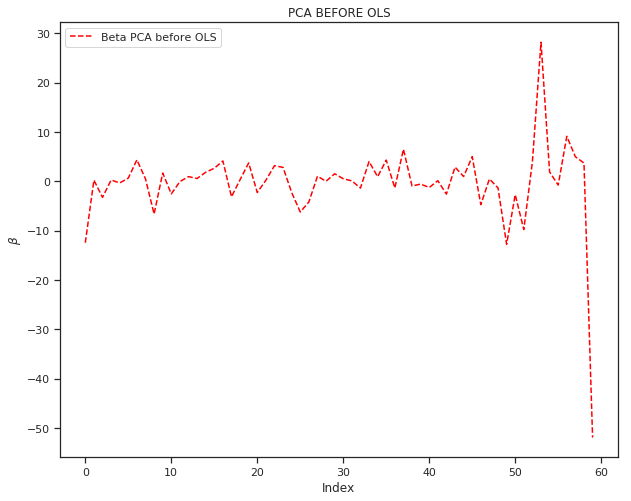

La package PCA centre et réduit (normalise) automatiquement les variables
On a pas le problème de non normalisation des variables à la suite du split


In [12]:
# modèle en Analyse en composante principale avant les moindres carrés
pca = PCA(n_components=60) # on ne selectionne que 60 composants
x_train_pca = pca.fit_transform(x_train)

# regression linéaire sur le PCA
regr_pca = LinearRegression().fit(x_train_pca, y_train) # les données sont normalisées

# Coefficient, hors constante
beta_pca = regr_pca.coef_

# plot des coefficients
plt.figure(figsize=(10,8))
plt.plot(beta_pca, '--', color='red', label='Beta PCA before OLS')
plt.title('PCA BEFORE OLS')
plt.legend()
plt.ylabel(r'$\beta$')
plt.xlabel('Index')
plt.show()

print('La package PCA centre et réduit (normalise) automatiquement les variables')
print('On a pas le problème de non normalisation des variables à la suite du split')

### OLS

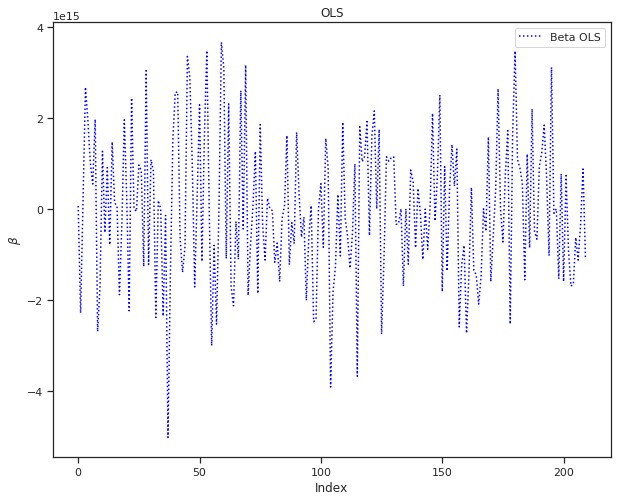

In [13]:
# regression par les moindres carrés
regrOLS = LinearRegression().fit(x_train, y_train)

# coefficients
beta = regrOLS.coef_

# plot des coefficients
plt.figure(figsize=(10,8))
plt.plot(beta,':', color='blue', label='Beta OLS')
plt.title('OLS')
plt.legend()
plt.ylabel(r'$\beta$')
plt.xlabel('Index')
plt.show()

# Question 6

Donner les valeurs des intercepts pour les 2 régressions précédentes. Donner la valeur moyenne
de la variable Y (sur le train set). Les intercepts des 2 questions sont-ils égaux ? Commenter.
Uniquement pour cette question, centrer et réduire les variables après ACP (de petite dimension).
Faire une régression avec ces variables et vérifier que l’intercept est bien égal à la moyenne de Y
sut le train.

### Analyse des regressions

In [14]:
print('Intercept du modèle PCA before OLS : \n', regr_pca.intercept_)
print('Intercept de l\'OLS : \n', regrOLS.intercept_)
print('Vérification de l\'égalité entre les deux constantes : \n',\
      np.isclose(regr_pca.intercept_,regrOLS.intercept_))
print('Moyenne du train de la variable à expliquer : \n',y_train.mean())
print('Vérification de l\'égalité entre PCA before OLS et y_.mean : \n',\
      np.isclose(regr_pca.intercept_,y_train.mean()))
print('On a une égalité car on a normalisé les X, du coup la constante du modèle est égale à la moyenne de Y')

Intercept du modèle PCA before OLS : 
 150.45892351274787
Intercept de l'OLS : 
 149.95892351274787
Vérification de l'égalité entre les deux constantes : 
 False
Moyenne du train de la variable à expliquer : 
 150.45892351274787
Vérification de l'égalité entre PCA before OLS et y_.mean : 
 True
On a une égalité car on a normalisé les X, du coup la constante du modèle est égale à la moyenne de Y


### Centrage et réduction du modèle PCA

In [15]:
# Centre et Normalise les features obtenus avec le PCA, étape non nécessaire dans notre cas
x_pca_norm = StandardScaler().fit_transform(x_train_pca)

# Regression linéaire
regr_pca_norm = LinearRegression().fit(x_pca_norm, y_train)

print('La valeur de l\'intercept dans le cas normalisé PCA before OLS est: \n', regr_pca_norm.intercept_)
print('Vérification de l\'égalité entre PCA before OLS et la moyenne de Y : \n',\
      np.isclose(regr_pca_norm.intercept_,y_train.mean()))


La valeur de l'intercept dans le cas normalisé PCA before OLS est: 
 150.45892351274787
Vérification de l'égalité entre PCA before OLS et la moyenne de Y : 
 True


# Question 7

Pour les 2 méthodes (OLS et PCA before OLS) : Tracer les résidus de la prédiction sur l’échantillon
test. Tracer leur densité (on pourra par exemple utiliser un histogramme). Calculer le coefficient de
détermination sur l’échantillon test. Calculer le risque de prédiction sur l’échantillon test.

### I) Calcul des y_hat et des résidus, sur les échantillons de test

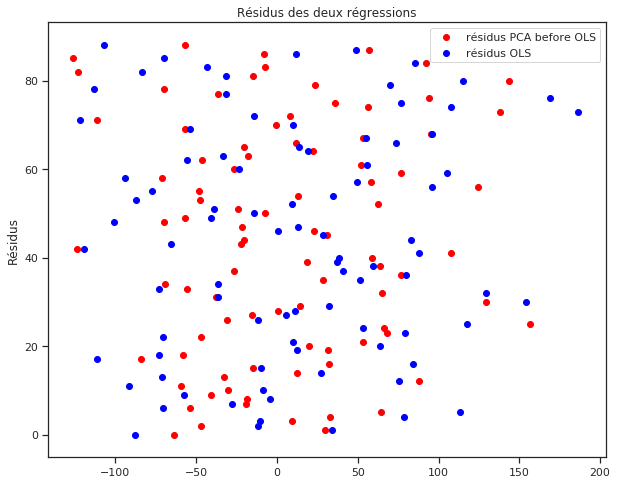

In [16]:
# Y estimés PCA before OLS / OLS
y_estim_pca = regr_pca.predict(pca.transform(x_test))
y_estim_ols = regrOLS.predict(x_test)

# Résidus PCA before OLS / OLS
res_pca = y_test - y_estim_pca
res_ols = y_test - y_estim_ols

# scatter des résidus
plt.figure(figsize=(10,8))
plt.scatter(res_pca, range(0,len(res_pca)), color='red', label='résidus PCA before OLS')
plt.scatter(res_ols, range(0,len(res_ols)), color='blue', label='résidus OLS')
plt.title('Résidus des deux régressions')
plt.legend()
plt.ylabel('Résidus')
plt.show()

### II) Densités

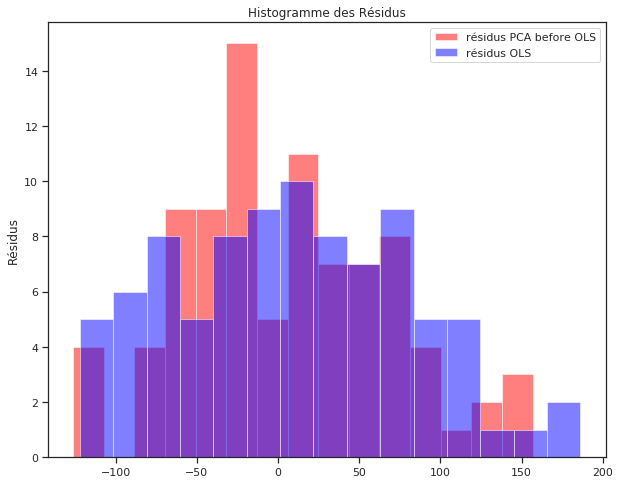

In [17]:
# histogramme des résidus
plt.figure(figsize=(10,8))
#bins pour le slicing, alpha pour l'opacité
plt.hist(res_pca, bins=15, alpha=0.5, color='red', label='résidus PCA before OLS')
plt.hist(res_ols, bins=15, alpha=0.5, color='blue', label='résidus OLS')
plt.title('Histogramme des Résidus')
plt.legend()
plt.ylabel('Résidus')
plt.show()

### III) Coefficients de determination

In [18]:
# R² PCA Before OLS / OLS
R2_pca = r2_score(y_test, y_estim_pca)
R2_ols = r2_score(y_test, y_estim_ols)

print('Le coefficient de determination, R² du PCA before OLS vaut : \n', R2_pca)
print('Le coefficient de determination, R² du OLS vaut : \n', R2_ols)

Le coefficient de determination, R² du PCA before OLS vaut : 
 0.29258705966577325
Le coefficient de determination, R² du OLS vaut : 
 0.04767298957775912


###  IV) Risque de prédiction

In [19]:
# Risque de prédiction PCA Before OLS / OLS
Rpred_pca = ((y_test - y_estim_pca) ** 2).mean()
Rpred_ols = ((y_test - y_estim_ols) ** 2).mean()

print('Le risque de prédiction du modèle PCA before OLS vaut : \n', Rpred_pca)
print('Le risque de prédiction du modèle OLS vaut : \n', Rpred_ols)

Le risque de prédiction du modèle PCA before OLS vaut : 
 3908.5717926709276
Le risque de prédiction du modèle OLS vaut : 
 5261.761947097517


# Question 8

Coder la méthode de forward variable sélection. On pourra utiliser la statistique du test de nullité
du coefficient (comme vu en cours). Pour l’instant, on ne met pas de critère d’arret sur la méthode.
C’est à dire que l’on ajoute une variable à chaque étape jusqu’à retrouver la totalité des variables.
Afficher l’ordre de séléction des variables.

In [20]:
# Forward Feature Selection sur le train set

# Initialisation des listes qui contiendront les features, les t-stats et p-value dans l'ordre de selections
feature_signif = []
t_stat_signif = []
p_value_signif = []

# Liste des features à tester
feature_list = list(range(0,infosDF[1]-2))

# Initilisation de la variables à expliquer dans le Forward Feature Selection
Y = y_train

while len(feature_list) > 0:
    
    # Liste des t-stat et de résidus pour chaque step
    t_stat = []
    res = []
    
    # Regression linéaire simple avec chacun des features
    for i in feature_list:

        # Variable explicative
        X = x_train[[i]]
        
        # Moyenne de de la variables explicative
        X_mean = np.mean(x_train[i])
        
        # Regression linéaire
        lr = LinearRegression().fit(X, Y)

        # Calcul de la prediction
        Y_pred = lr.predict(X) 

        # Calcul de la variance des résidus
        sigma_res = (( Y - Y_pred) ** 2).sum() / (X.shape[0] - 1)

        # Calcul de la variance du coefficient de la regression
        sigma_coef = sigma_res / ((x_train[i] - X_mean) ** 2).sum()

        # Calcul des résidus
        res.append(Y - Y_pred)
        
        # Calcul de la t-stat
        t_stat.append(abs(lr.coef_ / np.sqrt(sigma_coef)))
    
    # Récupère l'index de la variable la plus significative au step i
    ind_max = t_stat.index(max(t_stat))
    
    # Stock la variable la plus significative au step i
    feature_signif.append(feature_list[ind_max])
    
    # Stock la t-stat la plus élevée au step i
    t_stat_signif.append(t_stat)
    
    # Calcul et stock la p-value au step i 
    p_value = (1 - stat.t.cdf(max(t_stat), X.shape[0] - 1)) * 2
    p_value_signif.append(p_value)
    
    # Ré-initialise la variables à expliquer pour le step suivant
    Y =  res[ind_max]
    
    # Supprime la variable selectionée au step i
    del feature_list[ind_max]

print("Selection Forward des Features sans Critère d'arret: ")
print(feature_signif)

Selection Forward des Features sans Critère d'arret: 
[58, 123, 129, 111, 167, 133, 159, 208, 35, 68, 206, 14, 38, 19, 22, 173, 135, 112, 155, 118, 115, 49, 160, 34, 100, 80, 27, 192, 71, 74, 56, 84, 138, 43, 103, 165, 99, 166, 7, 172, 28, 190, 48, 39, 12, 187, 156, 131, 29, 97, 174, 79, 93, 141, 153, 23, 82, 104, 102, 47, 134, 180, 140, 83, 184, 195, 151, 186, 201, 53, 125, 142, 44, 36, 88, 120, 126, 147, 4, 76, 24, 21, 33, 25, 52, 17, 105, 91, 54, 182, 170, 158, 146, 161, 194, 77, 150, 164, 204, 70, 162, 200, 108, 202, 149, 205, 0, 37, 181, 117, 55, 139, 8, 90, 85, 169, 157, 121, 1, 178, 113, 168, 188, 106, 57, 78, 130, 60, 13, 96, 87, 122, 86, 144, 61, 124, 199, 119, 148, 136, 143, 66, 15, 109, 89, 45, 127, 51, 26, 20, 2, 163, 132, 176, 65, 177, 75, 50, 9, 3, 31, 107, 5, 179, 116, 62, 18, 207, 46, 67, 72, 11, 203, 189, 196, 73, 110, 128, 69, 40, 94, 30, 171, 183, 81, 95, 6, 145, 101, 152, 191, 98, 63, 198, 137, 114, 175, 16, 197, 92, 42, 32, 185, 10, 154, 41, 64, 59, 193]


# Question 9

Critère d’arrêt : On décide d’arrêter lorsque la p-valeur dépasse 0.1. Illustrer la méthode en donnant
(i) les 3 graphes des statistiques obtenues lors de la sélection de la 1er, 2eme et 3eme variables (en
abscisse : l’index des variables, en ordonné : la valeur des stats) , (ii) le graphe des 50 premières
p-valeurs (dont chacune est associée à la variable sélectionnée). Sur ce même graphe, on tracera la
ligne horizontale d’ordonnée 0.1. Enfin on donnera la liste des variables sélectionnées.

#### i) Séléction des 3 premières variables

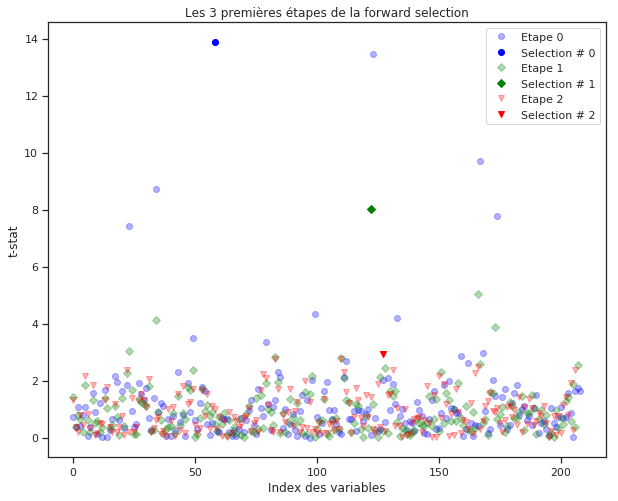

In [21]:
# t-stats pour les 3 premiers step du Forward Features selection
plt.figure(figsize=(10, 8))
# 1er step
plt.plot(t_stat_signif[0], 'o', c ='blue', label="Etape 0", alpha=0.3)
plt.plot(t_stat_signif[0].index(max(t_stat_signif[0])), max(t_stat_signif[0]), \
         'o', c='blue', label="Selection # 0")

# 2eme step
plt.plot(t_stat_signif[1], 'D',c='green', label="Etape 1", alpha=0.3)
plt.plot(t_stat_signif[1].index(max(t_stat_signif[1])), max(t_stat_signif[1]), \
         'D', c='green', label="Selection # 1")

# 3eme step
plt.plot(t_stat_signif[2],'v', c='red', label="Etape 2", alpha=0.3)
plt.plot(t_stat_signif[2].index(max(t_stat_signif[2])), max(t_stat_signif[2]), \
         'v', c='red', label="Selection # 2")

# graphiques
plt.xlabel('Index des variables')
plt.ylabel('t-stat')
plt.legend()
plt.title('Les 3 premières étapes de la forward selection')
plt.show()

#### ii) Graphique des 50 premières p-values

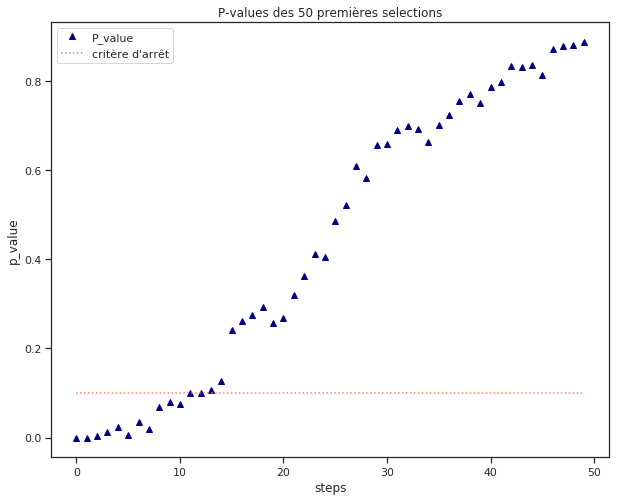

In [22]:
# Affiche les 50 premieres p-values de la Forward features selection
plt.figure(figsize=(10, 8))
plt.plot(p_value_signif[:50], '^', color ='navy', label='P_value')
plt.plot([0.1]*50, linestyle=':', color='salmon', label='critère d\'arrêt')
plt.xlabel('steps')
plt.ylabel('p_value')
plt.title('P-values des 50 premières selections')
plt.legend()
plt.show()

#### Forward Selection avec un critère d'arrêt si p-value < 0.1

In [23]:
# Forward Feature Selection sur le train set

# Initialisation des listes qui contiendront les features, les t-stats et p-value dans l'ordre de selections
feature_signif = []
t_stat_signif = []
p_value_signif = []

# Liste des features à tester
feature_list = list(range(0,infosDF[1]-2))

# Initilisation de la variables à expliquer dans le Forward Feature Selection
Y = y_train

while len(feature_list) > 0:
    
    # Liste des t-stat et de résidus pour chaque step
    t_stat = []
    res = []
    
    # Regression linéaire simple avec chacun des features
    for i in feature_list:

        # Variable explicative
        X = x_train[[i]]
        
        # Moyenne de de la variables explicative
        X_mean = np.mean(x_train[i])
        
        # Regression linéaire
        lr = LinearRegression().fit(X, Y)

        # Calcul de la prediction
        Y_pred = lr.predict(X) 

        # Calcul de la variance des résidus
        sigma_res = (( Y - Y_pred) ** 2).sum() / (X.shape[0] - 1)

        # Calcul de la variance du coefficient de la regression
        sigma_coef = sigma_res / ((x_train[i] - X_mean) ** 2).sum()

        # Calcul des résidus
        res.append(Y - Y_pred)
        
        # Calcul de la t-stat
        t_stat.append(abs(lr.coef_ / np.sqrt(sigma_coef)))
    
    # Récupère l'index de la variable la plus significative au step i
    ind_max = t_stat.index(max(t_stat))
    
    # Stock la variable la plus significative au step i
    feature_signif.append(feature_list[ind_max])
    
    # Stock la t-stat la plus élevée au step i
    t_stat_signif.append(t_stat)
    
    # Calcul et stock la p-value au step i 
    p_value = (1 - stat.t.cdf(max(t_stat), X.shape[0] - 1)) * 2
    p_value_signif.append(p_value)
    
    # Ré-initialise la variables à expliquer pour le step suivant
    Y =  res[ind_max]
    
    # Supprime la variable selectionée au step i
    del feature_list[ind_max]
    
    # rajout du critère d'arret 
    if p_value_signif[-1] > 0.1:
        feature_list = []

print('Selection Forward des Features avec Critère d\'arret: p-value < 0.1')
print(feature_signif[:-1])
print('On selectionne donc ', len(feature_signif[:-1]), ' Variables')
print('-----------------------------------------------------------------------')
print('Selection Forward des Features avec Critère d\'arret et prise en compte de la p-valeur d\'arret:\
 p-value < 0.1')
print(feature_signif)
print('On selectionne donc', len(feature_signif), ' Variables')
print('la feature :', feature_signif[-1], ' a donc une p-value > 0.1')

Selection Forward des Features avec Critère d'arret: p-value < 0.1
[58, 123, 129, 111, 167, 133, 159, 208, 35, 68, 206, 14, 38]
On selectionne donc  13  Variables
-----------------------------------------------------------------------
Selection Forward des Features avec Critère d'arret et prise en compte de la p-valeur d'arret: p-value < 0.1
[58, 123, 129, 111, 167, 133, 159, 208, 35, 68, 206, 14, 38, 19]
On selectionne donc 14  Variables
la feature : 19  a donc une p-value > 0.1


# Question 10

Appliquer OLS sur les variables sélectionnées. Donner le risque de prédiction obtenu l’échantillon
test et le comparer à ceux de OLS et PCA before OLS.

In [24]:
#dftest = df[feature_signif[:-1]]
# Regression lineaire avec variable selectionnée précédemment
regr_SF = LinearRegression().fit(x_train[feature_signif[:-1]], y_train)
y_estim_SF = regr_SF.predict(x_test[feature_signif[:-1]])

# Coefficient de determination
R2_SF = r2_score(y_test, y_estim_SF)

# Risque de prediction
Rpred_SF = ((y_test - y_estim_SF) ** 2).mean()

print('Le coefficient de détermination R² dans le cas Forward features selection est: \n', R2_SF)
print('Le risque de prédiction dans le cas Forward features selection est: \n', Rpred_SF)

print('\n=============== RAPPEL==================')
print('Le risque de prédiction du modèle PCA before OLS vaut : \n', Rpred_pca)
print('Le coefficient de determination, R² du PCA before OLS vaut : \n', R2_pca)
print('Le risque de prédiction du modèle OLS vaut : \n', Rpred_ols)
print('Le coefficient de determination, R² du OLS vaut : \n', R2_ols)
print('========================================')

print('\nGrâce à la Forward Selection, ce modèle est bien plus efficace que l\'ancien modèle OLS \
\nMais il est aussi légèrement meilleur que le modèle \'PCA before OLS\' ' )

Le coefficient de détermination R² dans le cas Forward features selection est: 
 0.2941767216986583
Le risque de prédiction dans le cas Forward features selection est: 
 3899.78865084901

=============== RAPPEL==================
Le risque de prédiction du modèle PCA before OLS vaut : 
 3908.5717926709276
Le coefficient de determination, R² du PCA before OLS vaut : 
 0.29258705966577325
Le risque de prédiction du modèle OLS vaut : 
 5261.761947097517
Le coefficient de determination, R² du OLS vaut : 
 0.04767298957775912

Grâce à la Forward Selection, ce modèle est bien plus efficace que l'ancien modèle OLS 
Mais il est aussi légèrement meilleur que le modèle 'PCA before OLS' 


# Question 11

Afin de préparer la validation croisée, séparer l’échantillon train en 4 parties (appelées ”folds”) de
façon aléatoire. On affichera les numéros d’échantillon sélectionnés dans chaque fold.

In [25]:
# Sépare l'échantillon train en 4 folds 
kfolds = KFold(n_splits=4, random_state=2, shuffle=True)

# Récupere les index du shuffle
index_train = []
index_test = []
for train, test in kfolds.split(x_train):
    index_train.append(train)
    index_test.append(test)

# mise en place des 4 folds en DataFrame, pour le train et le test
IdxTestDF = pd.DataFrame(index_test)
IdxTrainDF = pd.DataFrame(index_train)

### Affichage en dataframe des indices pour la partie test des 4 folds

#### Affichage de la partie Test

In [26]:
IdxTestDF.T.head(math.ceil(x_train.shape[0] / 4)) # permet d'arrondir au supérieur, NaN à la fin du coup

,0,1,2,3
0,3.0,2.0,0.0,15.0
1,7.0,4.0,1.0,16.0
2,10.0,5.0,8.0,19.0
3,12.0,6.0,9.0,22.0
4,13.0,11.0,21.0,26.0
5,17.0,14.0,27.0,31.0
6,20.0,18.0,32.0,33.0
7,24.0,23.0,36.0,34.0
8,25.0,28.0,37.0,38.0
9,29.0,39.0,40.0,43.0


#### Affichage de la partie Train

In [27]:
IdxTrainDF.T.head(math.ceil(x_train.shape[0] / 4))

,0,1,2,3
0,0.0,0.0,2.0,0.0
1,1.0,1.0,3.0,1.0
2,2.0,3.0,4.0,2.0
3,4.0,7.0,5.0,3.0
4,5.0,8.0,6.0,4.0
5,6.0,9.0,7.0,5.0
6,8.0,10.0,10.0,6.0
7,9.0,12.0,11.0,7.0
8,11.0,13.0,12.0,8.0
9,14.0,15.0,13.0,9.0


# Question 12

Appliquer la méthode de la régression ridge. Pour le choix du paramètre de régularisation, on fera
une validation croisée sur les ”folds” définies lors de la question précédente. A tour de rôle chacune
des ”folds” servira pour calculer le risque de prédiction alors que les autres seront utilisées pour
estimer le modèle. On moyennera ensuite les 4 risques de prédictions. On donnera la courbe du
risque de validation croisée en fonction du paramètre de régularisation (on veillera à bien choisir
l’espace de définition pour le graphe). Donner le paramètre de régularisation optimal et la valeur
du risque sur le test.

#### Méthode Ridge avec Cross-Validation des 4-folds

Le paramètre de régularisation RIDGE optimal obtenu par Validation croisée est : 
 50.68368368368369
Son score est de : 
 3576.5555983668687


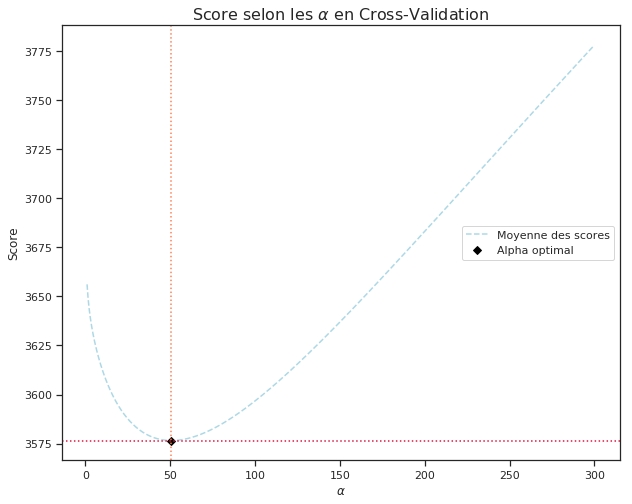

In [28]:
# Liste des paramètres de régularisation à tester
alphas = np.linspace(1, 300, 1000)

# Initialisation liste des risques de prédiction en Cross Validation
R_pred_cv = []

# Cross Validation pour trouver le paramètre de régularisation optimal
for alpha_i in alphas:
    
    # Initialisation de la liste des risques de prediction pour chacun des k-folds
    R_pred = []
    
    # Regression Ridge sur les 4 folds
    for i in range(0, len(index_train)):
        
        # Regression Ridge
        ridge = linear_model.Ridge(alpha=alpha_i).fit(x_train.iloc[index_train[i]], y_train.iloc[index_train[i]])
        
        # Calcul de la prediction
        y_estim = ridge.predict(x_train.iloc[index_test[i]])
        
        # Calcul du risque de prediction
        R_pred.append(((y_train.iloc[index_test[i]] - y_estim) ** 2).mean())
    
    # Calcul du Risque de prediction moyen
    R_pred_cv.append(np.mean(R_pred))
    
# Selectionne le modele avec le risque de prediction le plus faible
ind_min = R_pred_cv.index(min(R_pred_cv))
alpha_opt = alphas[ind_min]

# Graphique
fig = plt.figure(figsize=(10, 8))
plt.plot(alphas, R_pred_cv, '--', color='lightblue', label='Moyenne des scores')
plt.plot(alpha_opt, R_pred_cv[ind_min], 'D', color='black', label='Alpha optimal')
plt.axhline(min(R_pred_cv), color='crimson', ls=':')
plt.axvline(alpha_opt, color='coral', ls=':')
plt.title('Score selon les ' + r'$\alpha$' + ' en Cross-Validation', fontsize = 16)
plt.xlabel(r'$\alpha$')
plt.ylabel('Score')
plt.legend()

print('Le paramètre de régularisation RIDGE optimal obtenu par Validation croisée est : \n', alpha_opt)
print('Son score est de : \n', R_pred_cv[ind_min])

#### Méthode Ridge avec Paramètre de régularisation optimal

In [29]:
# Regression Ridge avec le paramètre optimal
ridge_opti = linear_model.Ridge(alpha=alpha_opt).fit(x_train,y_train)
    
# Calcul de la prediction
y_estim_ridge = ridge_opti.predict(x_test)
        
# Calcul du coefficient de determination
R2_ridge = ridge_opti.score(x_test,y_test)

# Calcul du risque de prediction
Rpred_ridge = ((y_test - y_estim_ridge) ** 2).mean()

print('Le coefficient de determination R² dans le modèle Ridge optimal est: \n', R2_ridge)
print('Le risque de prédiction dans le cas Ridge optimal est: \n', Rpred_ridge)

print('\n=============== RAPPEL==================')
print('Le risque de prédiction du modèle PCA before OLS vaut : \n', Rpred_pca)
print('Le coefficient de determination, R² du PCA before OLS vaut : \n', R2_pca)
print('Le risque de prédiction du modèle OLS vaut : \n', Rpred_ols)
print('Le coefficient de determination, R² du OLS vaut : \n', R2_ols)
print('Le risque de prédiction dans le cas Forward features selection est: \n', Rpred_SF)
print('Le coefficient de détermination R² dans le cas Forward features selection est: \n', R2_SF)
print('========================================')

print('\nLa Forward Selection reste le modèle le plus efficace \
\nMais ce modèle Ridge est aussi moins bon que le modèle \'PCA before OLS\' ' )

Le coefficient de determination R² dans le modèle Ridge optimal est: 
 0.28736927051161665
Le risque de prédiction dans le cas Ridge optimal est: 
 3937.40092816625

=============== RAPPEL==================
Le risque de prédiction du modèle PCA before OLS vaut : 
 3908.5717926709276
Le coefficient de determination, R² du PCA before OLS vaut : 
 0.29258705966577325
Le risque de prédiction du modèle OLS vaut : 
 5261.761947097517
Le coefficient de determination, R² du OLS vaut : 
 0.04767298957775912
Le risque de prédiction dans le cas Forward features selection est: 
 3899.78865084901
Le coefficient de détermination R² dans le cas Forward features selection est: 
 0.2941767216986583

La Forward Selection reste le modèle le plus efficace 
Mais ce modèle Ridge est aussi moins bon que le modèle 'PCA before OLS' 


# Question 13

A l’aide de la fonction lassoCV de sklearn, choisir le paramètre de régularisation du LASSO. Donner
le risque de prédiction associé.

In [30]:
# Lasso CV regression
lasso_cv = LassoCV(alphas=alphas, cv=4, random_state=None).fit(x_train,y_train)

# Calcul de la prediction
y_estim_lasso = lasso_cv.predict(x_test)
        
# Calcul du coefficient de determination
R2_lasso = lasso_cv.score(x_test,y_test)

# Calcul du risque de prediction
Rpred_lasso = ((y_test - y_estim_lasso) ** 2).mean()

print('Le paramètre de régularisation LASSO optimal alpha obtenu par Validation croisée est : \n', lasso_cv.alpha_)
print('Le coefficient de determination R² dans le cas Ridge optimal est: \n', R2_lasso)
print('Le risque de prédiction dans le cas Ridge optimal est: \n', Rpred_lasso)

print('\n=============== RAPPEL==================')
print('Le risque de prédiction du modèle PCA before OLS vaut : \n', Rpred_pca)
print('Le coefficient de determination, R² du PCA before OLS vaut : \n', R2_pca)
print('Le risque de prédiction du modèle OLS vaut : \n', Rpred_ols)
print('Le coefficient de determination, R² du OLS vaut : \n', R2_ols)
print('Le risque de prédiction dans le cas Forward features selection est: \n', Rpred_SF)
print('Le coefficient de détermination R² dans le cas Forward features selection est: \n', R2_SF)
print('Le risque de prédiction dans le cas Ridge optimal est: \n', Rpred_ridge)
print('Le coefficient de determination R² dans le modèle Ridge optimal est: \n', R2_ridge)
print('========================================')

print('Ici le Lasso est le meilleur modèle')

Le paramètre de régularisation LASSO optimal alpha obtenu par Validation croisée est : 
 5.48948948948949
Le coefficient de determination R² dans le cas Ridge optimal est: 
 0.3855320038332799
Le risque de prédiction dans le cas Ridge optimal est: 
 3395.0358275628355

=============== RAPPEL==================
Le risque de prédiction du modèle PCA before OLS vaut : 
 3908.5717926709276
Le coefficient de determination, R² du PCA before OLS vaut : 
 0.29258705966577325
Le risque de prédiction du modèle OLS vaut : 
 5261.761947097517
Le coefficient de determination, R² du OLS vaut : 
 0.04767298957775912
Le risque de prédiction dans le cas Forward features selection est: 
 3899.78865084901
Le coefficient de détermination R² dans le cas Forward features selection est: 
 0.2941767216986583
Le risque de prédiction dans le cas Ridge optimal est: 
 3937.40092816625
Le coefficient de determination R² dans le modèle Ridge optimal est: 
 0.28736927051161665
Ici le Lasso est le meilleur modèle


# Question 14

Donner les variables selectionées par le lasso. Combien y-en a t-il ? Appliquer la méthode OLS aux
variables sélectionnées. Cette méthode est appelé Least-square LASSO.

#### I) Selection des variables à utiliser pour le Lasso

In [31]:
# Liste des features selectionné par le modèle Lasso
lasso_index = np.where(lasso_cv.coef_ != 0)
lasso_index = list(lasso_index[0])

print('On selectionne', len(lasso_index), ' Variables')
print("Les variables selectionnées par LASSO sont \n", lasso_index)

On selectionne 13  Variables
Les variables selectionnées par LASSO sont 
 [8, 49, 58, 84, 111, 112, 123, 129, 159, 167, 168, 174, 208]


#### II) Moindres carrés LASSO

In [32]:
# Regression lineaire avec variable selectionnée précédemment
lasso_ols = LinearRegression().fit(x_train[lasso_index], y_train)
y_estim_lasso_ols = lasso_ols.predict(x_test[lasso_index])

# Calcul du coefficient de determination
R2_lasso_ols = lasso_ols.score(x_test[lasso_index],y_test)

# Calcul du risque de prediction
Rpred_lasso_ols = ((y_test - y_estim_lasso_ols) ** 2).mean()

print('Le coefficient de détermination R² dans le cas Least-square LASSO est: \n', R2_lasso_ols)
print('Le risque de prédiction dans le cas Least-square LASSO est: \n', Rpred_lasso_ols)

print('\n=============== RAPPEL==================')
print('Le risque de prédiction du modèle PCA before OLS vaut : \n', Rpred_pca)
print('Le coefficient de determination, R² du PCA before OLS vaut : \n', R2_pca)
print('Le risque de prédiction du modèle OLS vaut : \n', Rpred_ols)
print('Le coefficient de determination, R² du OLS vaut : \n', R2_ols)
print('Le risque de prédiction dans le cas Forward features selection est: \n', Rpred_SF)
print('Le coefficient de détermination R² dans le cas Forward features selection est: \n', R2_SF)
print('Le risque de prédiction dans le cas Ridge optimal est: \n', Rpred_ridge)
print('Le coefficient de determination R² dans le modèle Ridge optimal est: \n', R2_ridge)
print('Le risque de prédiction dans le cas LASSO optimal est: \n', Rpred_lasso)
print('Le coefficient de determination R² dans le cas LASSO optimal est: \n', R2_lasso)
print('========================================')

print('Le meilleur modèle est le LASSO')

Le coefficient de détermination R² dans le cas Least-square LASSO est: 
 0.2866308424591022
Le risque de prédiction dans le cas Least-square LASSO est: 
 3941.480863508698

=============== RAPPEL==================
Le risque de prédiction du modèle PCA before OLS vaut : 
 3908.5717926709276
Le coefficient de determination, R² du PCA before OLS vaut : 
 0.29258705966577325
Le risque de prédiction du modèle OLS vaut : 
 5261.761947097517
Le coefficient de determination, R² du OLS vaut : 
 0.04767298957775912
Le risque de prédiction dans le cas Forward features selection est: 
 3899.78865084901
Le coefficient de détermination R² dans le cas Forward features selection est: 
 0.2941767216986583
Le risque de prédiction dans le cas Ridge optimal est: 
 3937.40092816625
Le coefficient de determination R² dans le modèle Ridge optimal est: 
 0.28736927051161665
Le risque de prédiction dans le cas LASSO optimal est: 
 3395.0358275628355
Le coefficient de determination R² dans le cas LASSO optimal 

# Question 15

Cette dernière question est un question d’ouverture vers une approche non-linéaire. En utilisant les
variables séléctionées par le LASSO (Q13) ou par la méthode forward (Q9), mettre au point une
méthode de regression non-linéaire. On apprendra les différents paramètres par validation croisée
et l’on donnera la valeur du risque de prédiction calculé sur l’échantillon test. Des performances
moindres par rapport à OLS peuvent se produire. Commenter.

### Support Vector Machines

In [33]:
# Regression non-lineaire avec variables selectionnées avec Forward Selection
SVM = svm.SVC().fit(x_train[feature_signif[:-1]], y_train)

y_estim_svm = SVM.predict(x_test[feature_signif[:-1]])

# Calcul du coefficient de determination
R2_svm = SVM.score(x_test[feature_signif[:-1]],y_test)

# Calcul du risque de prediction
Rpred_svm = ((y_test - y_estim_svm) ** 2).mean()

print('Le coefficient de détermination R² dans le cas SVM est: \n', R2_svm)
print('Le risque de prédiction dans le cas SVM est: \n', Rpred_svm)

Le coefficient de détermination R² dans le cas SVM est: 
 0.0
Le risque de prédiction dans le cas SVM est: 
 8364.258426966293


### Regression Polynomiale

In [34]:
# Regression non-lineaire avec variables selectionnées avec Forward Selection
poly = PolynomialFeatures(degree=2)
x_train_poly = poly.fit_transform(x_train[feature_signif[:-1]])
regr_poly = LinearRegression().fit(x_train_poly, y_train)

y_estim_poly = regr_poly.predict(poly.transform(x_test[feature_signif[:-1]]))

# Calcul du coefficient de determination
R2_poly = r2_score(y_test, y_estim_poly)

# Calcul du risque de prediction
Rpred_poly = ((y_test - y_estim_poly) ** 2).mean()

print('Le coefficient de détermination R² dans le cas de la regression polynomiale est: \n', R2_poly)
print('Le risque de prédiction dans le cas de la regression polynomiale est: \n', Rpred_poly)

Le coefficient de détermination R² dans le cas de la regression polynomiale est: 
 0.26550667603346867
Le risque de prédiction dans le cas de la regression polynomiale est: 
 4058.195325921427


## Résultats finaux

In [35]:
print('==============RESULTATS FINAUX=======================\n')
print('\n\t\t PCA BEFORE OLS')
print('Le risque de prédiction du modèle PCA before OLS vaut : \n', Rpred_pca)
print('Le coefficient de determination, R² du PCA before OLS vaut : \n', R2_pca)
print('\n\t\t OLS')
print('Le risque de prédiction du modèle OLS vaut : \n', Rpred_ols)
print('Le coefficient de determination, R² du OLS vaut : \n', R2_ols)
print('\n\t\t Forward Selection')
print('Le risque de prédiction dans le cas Forward features selection est: \n', Rpred_SF)
print('Le coefficient de détermination R² dans le cas Forward features selection est: \n', R2_SF)
print('\n\t\t Ridge')
print('Le risque de prédiction dans le cas Ridge optimal est: \n', Rpred_ridge)
print('Le coefficient de determination R² dans le modèle Ridge optimal est: \n', R2_ridge)
print('\n\t\t LASSO')
print('Le risque de prédiction dans le cas LASSO optimal est: \n', Rpred_lasso)
print('Le coefficient de determination R² dans le cas LASSO optimal est: \n', R2_lasso)
print('\n\t\t LS-LASSO')
print('Le risque de prédiction dans le cas Least-square LASSO est: \n', Rpred_lasso_ols)
print('Le coefficient de détermination R² dans le cas Least-square LASSO est: \n', R2_lasso_ols)
print('\n\t\t SVM')
print('Le risque de prédiction dans le cas SVM est: \n', Rpred_svm)
print('Le coefficient de détermination R² dans le cas SVM est: \n', R2_svm)
print('\n\t\t Regression Polynomiale')
print('Le risque de prédiction dans le cas regression polynomiale est: \n', Rpred_poly)
print('Le coefficient de détermination R² dans le cas regression polynomiale est: \n', R2_poly)
print('========================================================')

==============RESULTATS FINAUX=======================


		 PCA BEFORE OLS
Le risque de prédiction du modèle PCA before OLS vaut : 
 3908.5717926709276
Le coefficient de determination, R² du PCA before OLS vaut : 
 0.29258705966577325

		 OLS
Le risque de prédiction du modèle OLS vaut : 
 5261.761947097517
Le coefficient de determination, R² du OLS vaut : 
 0.04767298957775912

		 Forward Selection
Le risque de prédiction dans le cas Forward features selection est: 
 3899.78865084901
Le coefficient de détermination R² dans le cas Forward features selection est: 
 0.2941767216986583

		 Ridge
Le risque de prédiction dans le cas Ridge optimal est: 
 3937.40092816625
Le coefficient de determination R² dans le modèle Ridge optimal est: 
 0.28736927051161665

		 LASSO
Le risque de prédiction dans le cas LASSO optimal est: 
 3395.0358275628355
Le coefficient de determination R² dans le cas LASSO optimal est: 
 0.3855320038332799

		 LS-LASSO
Le risque de prédiction dans le cas Least-square LA